<h1 align="center">Discrete Fourier Transform, Filtering, and Convolution</h1>

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io import wavfile
import IPython
import scipy as sp
import time
from scipy import signal
from scipy.misc import imread
%matplotlib inline
plt.rcParams['figure.figsize'] = [15,8]

## SoundWave Class

In [2]:
class SoundWave(object):
    """A SoundWave class for working with digital audio signals.
    Attributes:
        rate (int): The sample rate of the sound.
        samples ((n,) ndarray): NumPy array of samples.
    """
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.
        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        Returns:
            A SoundWave object.
        """
        
        self.rate = rate
        self.samples = samples
            
    def plot(self):
        """Plot and display the graph of the sound wave."""
        
        plt.plot(np.arange(len(self.samples))/ self.rate,self.samples)
        plt.show()
        
    def export(self, filename):
        """Generate a wav file called filename from the sample rate and samples. 
        If the array of samples is not of type int16, scale it so that it is."""
        
        file = filename + '.wav'
        if self.samples.dtype != 'int16':
            big = np.max(self.samples)
            self.samples *= 32767
            self.samples /= big
            self.samples = np.int16(self.samples)
        wavfile.write(file, self.rate, self.samples)
            
    def __add__(self, other):
        """Add two sound waves together into one wave."""
        
        if len(self.samples) != len(other.samples):
            raise ValueError("samples must be of same length")
            
        return SoundWave(self.rate, self.samples+other.samples)
            
    def append(self, other):
        """Append additional samples to the end of the current samples."""
        
        if self.rate != other.rate:
            raise ValueError("rates must be the same")
            
        return SoundWave(self.rate, np.hstack((self.samples,other.samples)))
                        
    def plot_dft(self):
        """Take the DFT of the sound wave. Scale the x-axis so the x-values correspond
        to the frequencies present in the plot. Display the left half of the plot."""
        
        dft = abs(sp.fft(self.samples))
        N = dft.shape[0]
        x_vals = np.linspace(1, N//2, N//2)
        x_vals = x_vals * rate / (N//2) # Convert x_vals to frequencies
        
        plt.plot(x_vals, dft[:N//2])

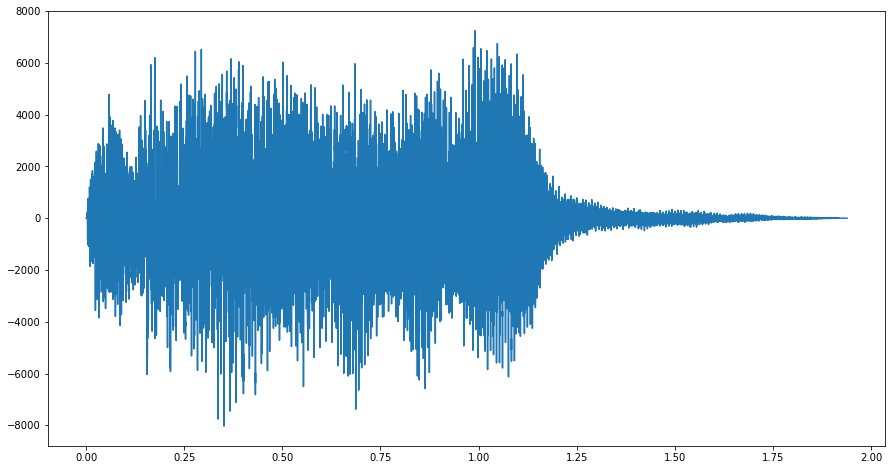

In [3]:
#Plot the graph of the "tada" sound file
rate, wave = wavfile.read('tada.wav')
tada = SoundWave(rate, wave)
tada.plot()

Display the original `tada.wav` sound.

In [4]:
IPython.display.Audio('tada.wav')

Use the export method to create a differently named file containing the same sound as `tada.wav`

In [5]:
tada.export('tada2')
IPython.display.Audio('tada2.wav')
#why is this one louder?

In [6]:
wave_function = lambda x, freq: np.sin(2*np.pi*x*freq)
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 samples per second.
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    samplerate = 44100
    pts = np.linspace(0,duration, int(samplerate*duration))
    samples = wave_function(pts, frequency)
        
    return SoundWave(samplerate, samples)

Generate an 'A' note and display it.

In [7]:
A = generate_note(440, 2.0)
A.export('A')
IPython.display.Audio('A.wav')

## Problem 4

Generate a minor chord ('A', 'C', and 'E' notes) and display it.

In [8]:
A = generate_note(440, 2.0)
C = generate_note(523.25, 2.0)
E = generate_note(659.25, 2.0)
chord = A+C+E
chord.export('chord')
IPython.display.Audio('chord.wav')

Generate and display a sound that changes over time.

In [9]:
A2 = generate_note(440, 2.0)
C2 = generate_note(523.25, 2.0)
new = A2.append(C2)
new.export('new')
IPython.display.Audio('new.wav')

Use a naive approach to compute the DFT and the FFT of an array of samples

In [10]:
def naive_DFT(samples):
    """Compute the DFT of the array of samples using the naive method.
    Parameters:
        samples ((n,) ndarray): NumPy array of samples.
    Returns:
        dft ((n,) ndarray): The DFT of the given array."""
    
    C = np.zeros_like(samples)
    N = len(samples)
    myLen = np.arange(N)
    
    C = C.astype(np.complex128)
    for k,v2 in enumerate(C):
        C[k] = np.sum(samples*np.exp((-2*np.pi*1j*k*myLen)/N))
    return C

In [12]:
def FFT(samples):
    """Compute the DFT using the FFT algorithm.
    Parameters:
        samples ((n,) ndarray): NumPy array of samples.
    Returns:
        dft ((n,) ndarray): The DFT of the given array."""
    
    N = len(samples)
    if N == 1:
        return naive_DFT(samples)
    else:
        even = FFT(samples[::2])
        odd = FFT(samples[1::2])
        k = np.arange(N)
        factor = np.exp((-2*np.pi*1j*k)/N)
        
        return np.concatenate((even+factor[:N//2]*odd,even+factor[N//2:]*odd))

Note that my function for FFT has the same results as the scipy one.

In [13]:
samples = np.random.random(1024)
spC = sp.fft(samples)
C = FFT(samples)
np.allclose(spC,C)

True

Now, compare the runtimes of your `naive_DFT()`, your `FFT()` function, and the SciPy method on the same random sample. Print the results.

In [14]:
samples = np.random.random(1024)
print("scipy's built-in function:")
%timeit sp.fft(samples)
print("my FFT function:")
%timeit FFT(samples)
print("my Naive DFT function:")
%timeit naive_DFT(samples)

scipy's built-in function:
The slowest run took 9.37 times longer than the fastest. This could mean that an intermediate result is being cached.
10000 loops, best of 3: 24.5 µs per loop
my FFT function:
10 loops, best of 3: 28.4 ms per loop
my Naive DFT function:
10 loops, best of 3: 104 ms per loop


## Problem 7

Write the `plot_dft()` method in the `SoundWave` class.

Display the plot of the DFT of the 'A' note.

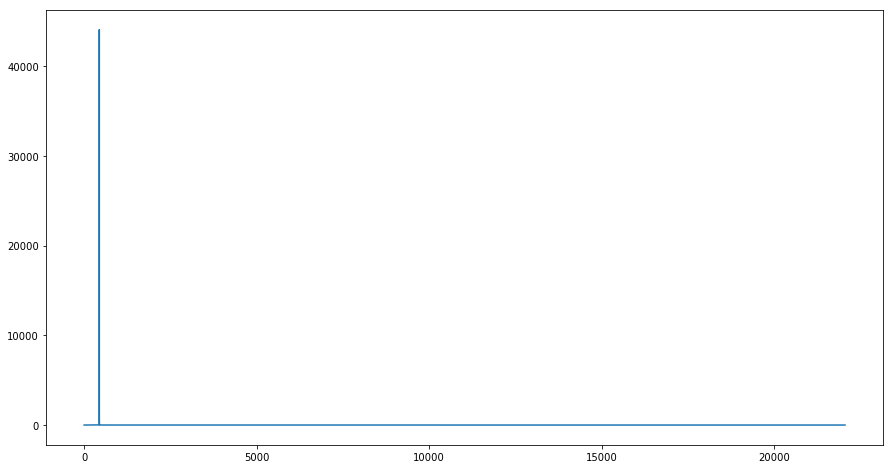

In [15]:
A.plot_dft()

Display the plot of the DFT of the minor chord.

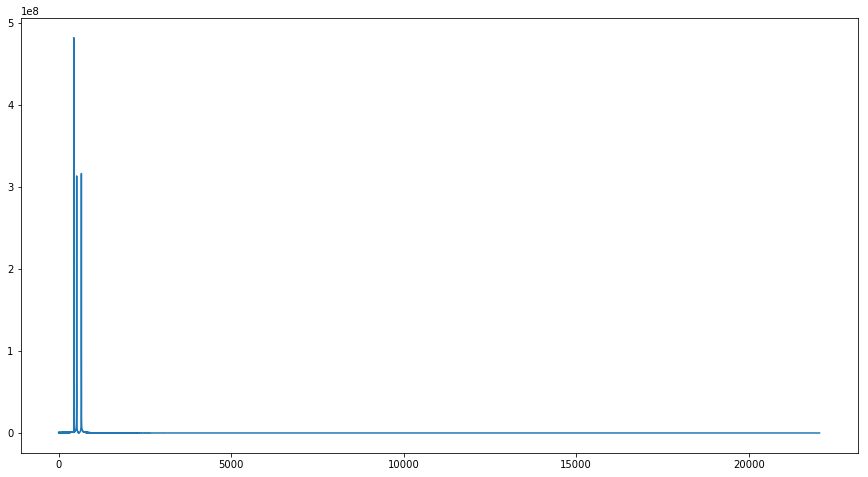

In [16]:
chord.plot_dft()

# Filtering and Convolution

In [18]:
# Audio of tada.wav.
IPython.display.Audio("tada.wav")

Circular convolution of `tada.wav` and two seconds of white noise. 

In [19]:
samplerate = 22050
noise = np.int16(np.random.randint(-32767, 32767, samplerate*2))

rate, wave = wavfile.read('tada.wav')

sample = np.append(wave, np.zeros(len(noise)-len(wave)))

mynoise = np.real(sp.ifft(sp.fft(sample)*sp.fft(noise)))
sounds = SoundWave(samplerate, mynoise)

Use the `append()` method in the `SoundWave` class to loop multiple copies of the signal consecutively. 

In [20]:
conv_tada = sounds.append(sounds).append(sounds)
conv_tada.export('conv_tada')
IPython.display.Audio('conv_tada.wav')

In [21]:
# Audio of the AEA.wav
IPython.display.Audio('AEA.wav')

In [22]:
# Audio of EAE.wav
IPython.display.Audio('EAE.wav')

Calculate the linear convolution using the FFT and IFFT. 

In [23]:
# Naive algorithm for a linear convolution. 
def naive_convolve(sample1,sample2):
    """Calculate the linear conovolution of sample1 and sample2 using the definition of convolution.

    Parameters:
        sample1 ((n,) ndarray): an array of length n representing the first sound sample. 
        sample2 ((m,) ndarray): an array of length m representing the second sound sample. 
    
    Return:
        ((n+m-1,) ndarray): an array of length n+m-1 representing the convolution of the two samples. 
    """
    sig1 = np.append(sample1, np.zeros(len(sample2)-1))
    sig2 = np.append(sample2, np.zeros(len(sample1)-1))

    final = np.zeros_like(sig1)
    rsig1 = sig1[::-1]
    for k in range(len(sig1)):
        final[k] = np.sum((np.append(rsig1[(k-1):],rsig1[:(k-1)]))*sig2)
    return final

# Linear Convolution using the Fourier Transforms
def convolve_fft(sample1,sample2):
    """Calculate the linear conovolution of sample1 and sample2 using the Convolution Theorem.

    Parameters:
        sample1 ((n,) ndarray): an array of length n representing the first sound samples. 
        sample2 ((m,) ndarray): an array of length m representing the second sound samples. 
    
    Return:
        ((n+m-1,) ndarray): an array of length n+m-1 representing the convolution of the two samples. 
    """
    
    len1 = len(sample1)
    len2 = len(sample2)
    sample1 = np.append(sample1, np.zeros(len2-1))
    sample2 = np.append(sample2, np.zeros(len1-1))

    return np.real(sp.ifft(sp.fft(sample1)*sp.fft(sample2)))[:(len1+len2-1)]

Report the amount of time it takes to convolve samples of `AEA.wav` and `EAE.wav` with my `convolve_fft()`, `signal.convolve.fft()`, and `naive_convolve()` functions. 

In [24]:
rateA, AEA = wavfile.read('AEA.wav')
rateE, EAE = wavfile.read('EAE.wav')

%timeit naive_convolve(AEA,EAE)
%timeit convolve_fft(AEA,EAE)
%timeit signal.fftconvolve(AEA,EAE)

1 loop, best of 3: 5.11 s per loop
10 loops, best of 3: 42.1 ms per loop
100 loops, best of 3: 2.15 ms per loop


In [25]:
# Listen to the audio created by the convolve_fft() function.
c = convolve_fft(AEA,EAE)
IPython.display.Audio(rate = rateA, data = c)

In [26]:
# Listen to the audio created by the sp.signal.fftconvolve() function.
s = signal.fftconvolve(AEA,EAE)
IPython.display.Audio(rate = rateA, data = s)

Convolve Chopin with a balloon popping in a big room

In [27]:
# Audio of chopin.wav. 
IPython.display.Audio("chopin.wav")

In [28]:
# Audio of balloon.wav. 
IPython.display.Audio("balloon.wav")

In [29]:
rate, chopin = wavfile.read('chopin.wav')
rate, balloon = wavfile.read('balloon.wav')

s2 = signal.fftconvolve(chopin, balloon)
IPython.display.Audio(rate = rate, data = s2)

A function that removes a range of frequencies in a signal.

In [30]:
def clean_signal(samples, rate, low_freq, high_freq):
    """Remove a range of frequencies from a sound sample using the Fourier Transform. 
    
    Parameters:
        samples ((n,) ndarray): Array of sound samples of length n. 
        rate (int): Sampling rate (the number of samples per second). 
        low_freq (float): Lower bound of the frequency range. 
        high_freq (float): Higher boound of the frequency range. 
    Returns:
        ((n,) ndarray): Array of the samples with the frequencies removed. 
    """
    low = low_freq*len(samples)//rate
    high = high_freq*len(samples)//rate
    fft = sp.fft(samples)
    fft[low:high] = 0
    fft[-high:-low] = 0
    return np.real(sp.ifft(fft))

In [31]:
# Audio of Noisysignal2.wav.
IPython.display.Audio("Noisysignal2.wav")

Plot the DFT of the Noisysignal2.wav to determine the frequencies with high amplitudes.

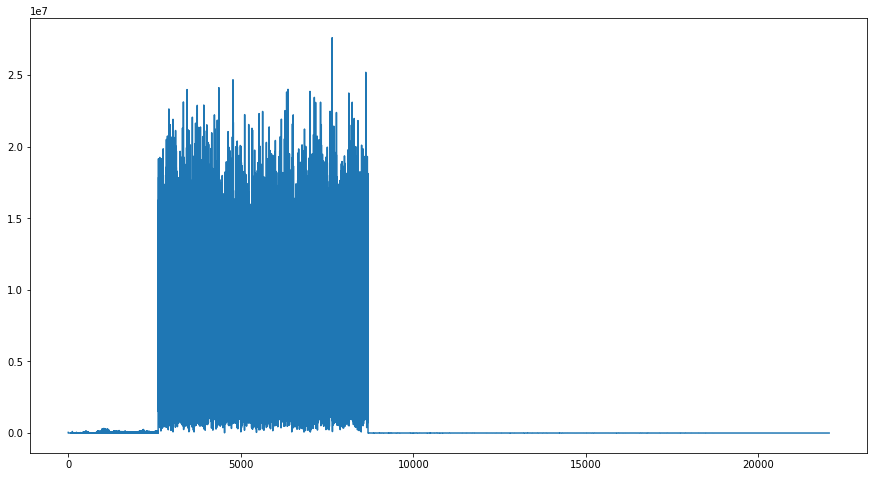

In [32]:
rate, wave = wavfile.read('Noisysignal2.wav')
Noisysignal2 = SoundWave(rate,wave)
Noisysignal2.plot_dft()

Clean the signal by using the function you have written and make this signal a `SoundWave` object.

In [33]:
tmp = clean_signal(wave, rate, 1300, 8000)
IPython.display.Audio(rate = rate, data = tmp)

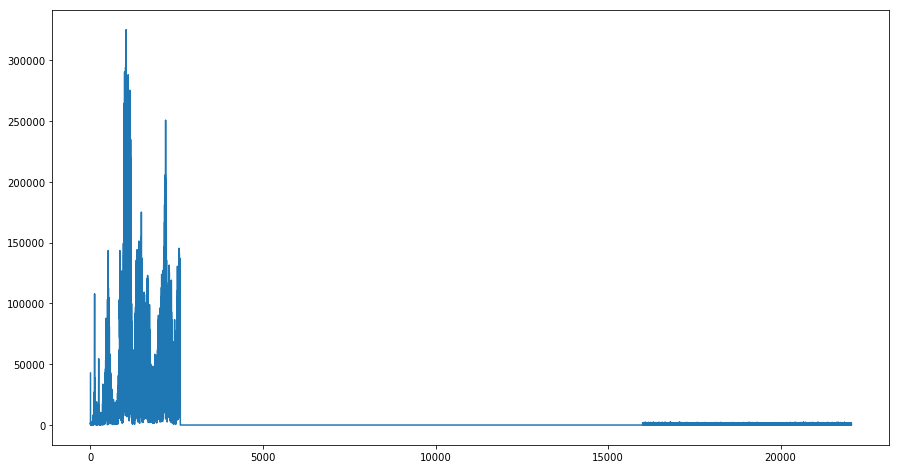

In [34]:
# Use this box to plot the new signal in the frequency domain. 
# This helps fine-tune the high and low frequencies to filter out. 
clean = SoundWave(rate, tmp)
clean.plot_dft()

Filter out the vuvuzela noise in the `vuvuzela.wav` sound file by setting the coefficients at the frequencies 200-500 Hz to zero. 

In [35]:
# Original sound clip: vuvuzela.wav
IPython.display.Audio("vuvuzela.wav")

In [37]:
rate, wave = wavfile.read('vuvuzela.wav')
clean = clean_signal(wave[:,0], rate, 200, 500)
clean2 = clean_signal(wave[:,1], rate, 200, 500)
vuv = SoundWave(rate,np.vstack((clean,clean)).T)
vuv.export('vuv')
IPython.display.Audio('vuv.wav')

Clean up the license plate image to determine the year printed on the sticker in the bottom right corner. Note this is a bit contrived, but a fun example of how one could use a 2D FFT. You can't read teh year sicker in this image, but in the filtered on you can.

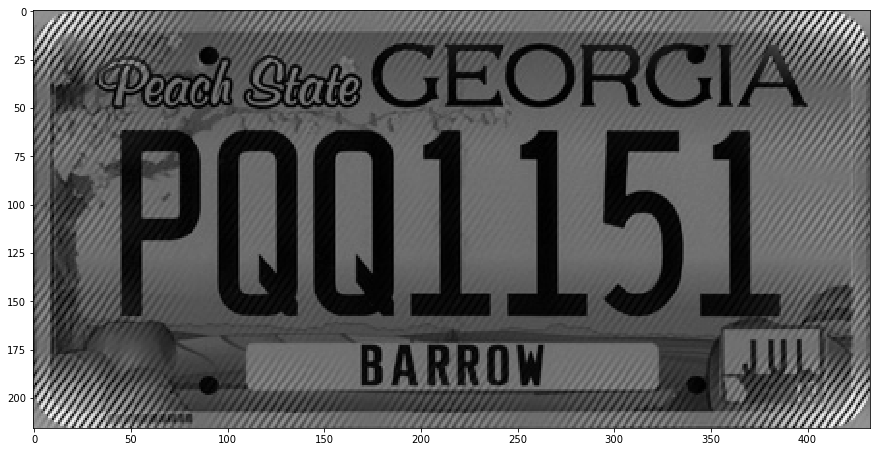

In [38]:
# Display the blurry image
image = imread("license_plate.png", True)
plt.imshow(image, cmap='gray')
plt.show()

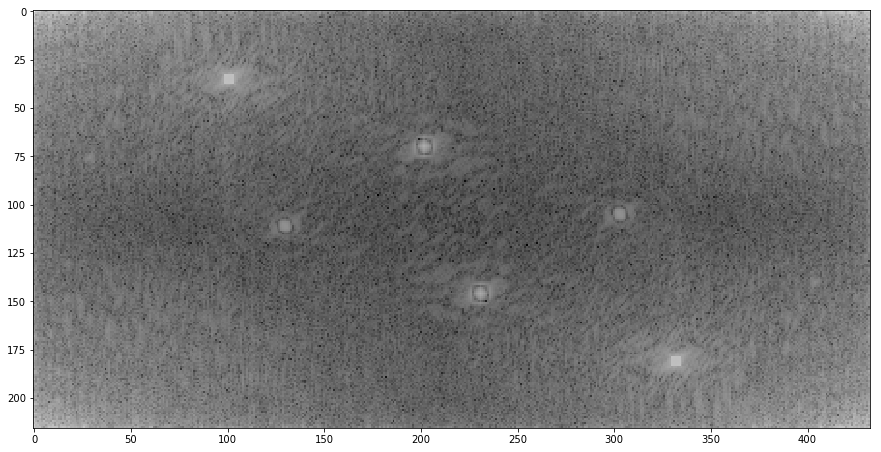

In [64]:
# Display the fft of the image
fft = np.fft.fft2(image)
plt.imshow(np.log(np.abs(fft)), cmap='gray')
plt.show()

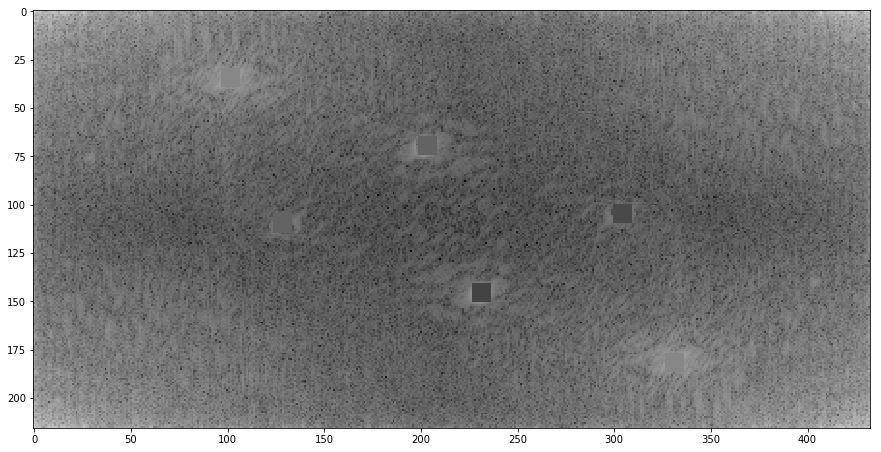

In [72]:
# Clean up the fft and display it
fft[30:40, 97:107] = np.ones((10,10)) * fft[33][50]
fft[-39:-29, -106:-96] = np.ones((10,10)) * fft[33][50]
fft[65:75, 199:209] = np.ones((10,10)) * fft[60][175]
fft[105:115, 124:134] = np.ones((10,10)) * fft[100][120]
fft[141:151, 227:237] = np.ones((10,10)) * fft[135][220]
fft[100:110, 300:310] = np.ones((10,10)) * fft[95][295]
plt.imshow(np.log(np.abs(fft)),cmap='gray')
plt.show()

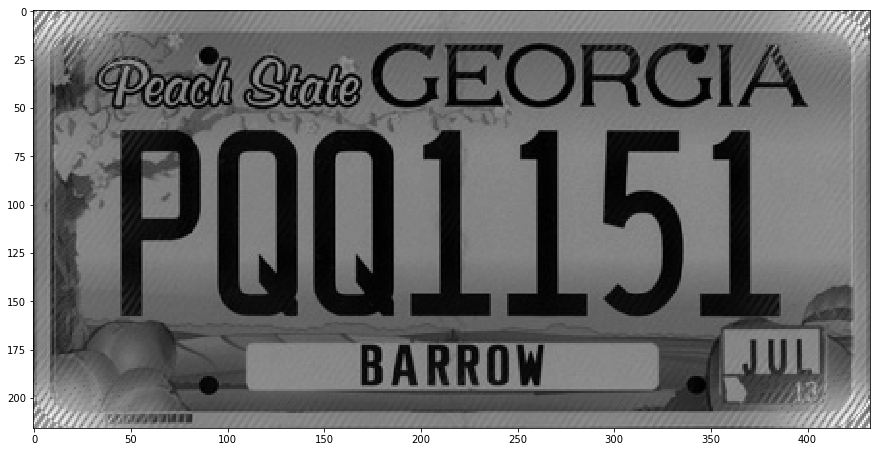

In [73]:
# Display the newly deblurred image
new_image = np.abs(np.fft.ifft2(fft))
plt.imshow(new_image, cmap='gray')
plt.show()

Note the year on the sticker has emerged! (it's 13)